In [1]:
# Install Kaggle API client
!pip install kaggle

# Upload your Kaggle API key (kaggle.json)
from google.colab import files
files.upload()

# Create Kaggle directory and copy API key
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Download the dataset
!kaggle datasets download -d abdullahtauseef2003/adni-4c-alzheimers-mri-classification-dataset

# Unzip the dataset
!unzip adni-4c-alzheimers-mri-classification-dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: AugmentedAlzheimerDataset/LMCI/704dcd6c-b988-4221-8f70-f528992aee88.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/705f871d-d4dd-4ccb-a713-d20724fe2f17.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/7069c7cf-f4db-4c97-9c80-db7f3abd0643.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/70743509-c035-4392-b5a5-a35687c4ae67.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/707c8044-826c-410c-abf7-0355d770e966.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/707d3e15-7d33-44e2-8172-906ccff06a36.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/70804c51-b847-49e4-9cb0-73800c71b079.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/7082349e-7033-4ecd-99dd-2ed5f107e4cf.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/7083fd14-8b23-4212-93a0-97d285d6236d.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/708ca1d2-4e2e-45aa-8f72-4bc96a700007.jpg  
  inflating: AugmentedAlzheimerDataset/LMCI/70924e6b-dffc-4ebc-be4c-e82b1279c0f

In [2]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm
from imblearn.over_sampling import SMOTE

In [3]:
import os
import pandas as pd
from tqdm import tqdm

images = []
labels = []

dataset_path = "/content/AugmentedAlzheimerDataset"

for folder in tqdm(os.listdir(dataset_path)):
    folder_path = os.path.join(dataset_path, folder)
    for image_filename in os.listdir(folder_path):
        image_path = os.path.join(folder_path, image_filename)
        images.append(image_path)
        labels.append(folder)  # Use folder name as label

df = pd.DataFrame({'image': images, 'label': labels})
df

100%|██████████| 5/5 [00:00<00:00, 70.35it/s]


,image,label
0,/content/AugmentedAlzheimerDataset/AD/52fb377d...,AD
1,/content/AugmentedAlzheimerDataset/AD/ddc72fba...,AD
2,/content/AugmentedAlzheimerDataset/AD/0ccddad9...,AD
3,/content/AugmentedAlzheimerDataset/AD/a1445819...,AD
4,/content/AugmentedAlzheimerDataset/AD/76746169...,AD
...,...,...
45735,/content/AugmentedAlzheimerDataset/LMCI/ac4c4f...,LMCI
45736,/content/AugmentedAlzheimerDataset/LMCI/814f95...,LMCI
45737,/content/AugmentedAlzheimerDataset/LMCI/39c381...,LMCI
45738,/content/AugmentedAlzheimerDataset/LMCI/733f24...,LMCI


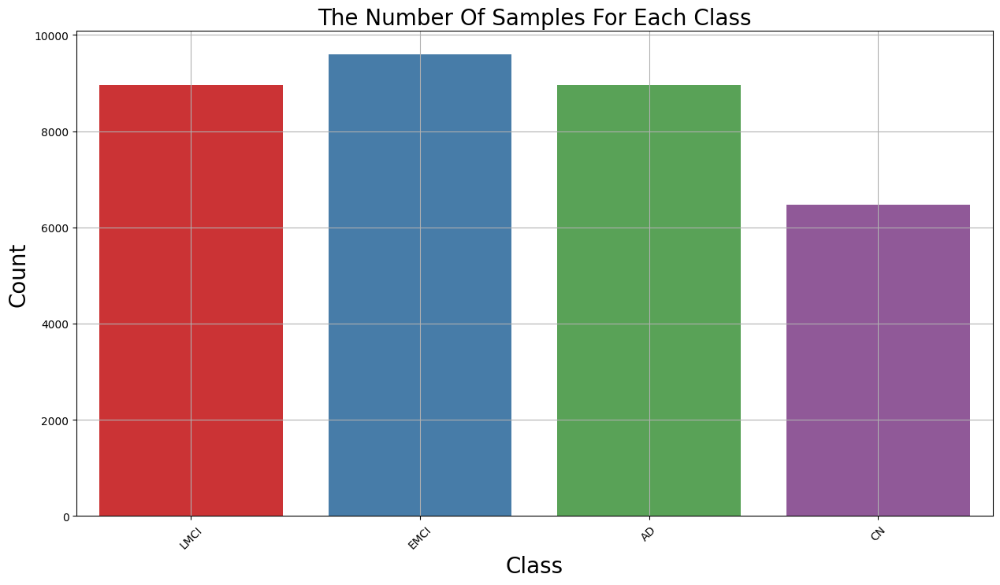

In [ ]:
plt.figure(figsize=(15,8))
ax = sns.countplot(x=df.label,palette='Set1')
ax.set_xlabel("Class",fontsize=20)
ax.set_ylabel("Count",fontsize=20)
plt.title('The Number Of Samples For Each Class',fontsize=20)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

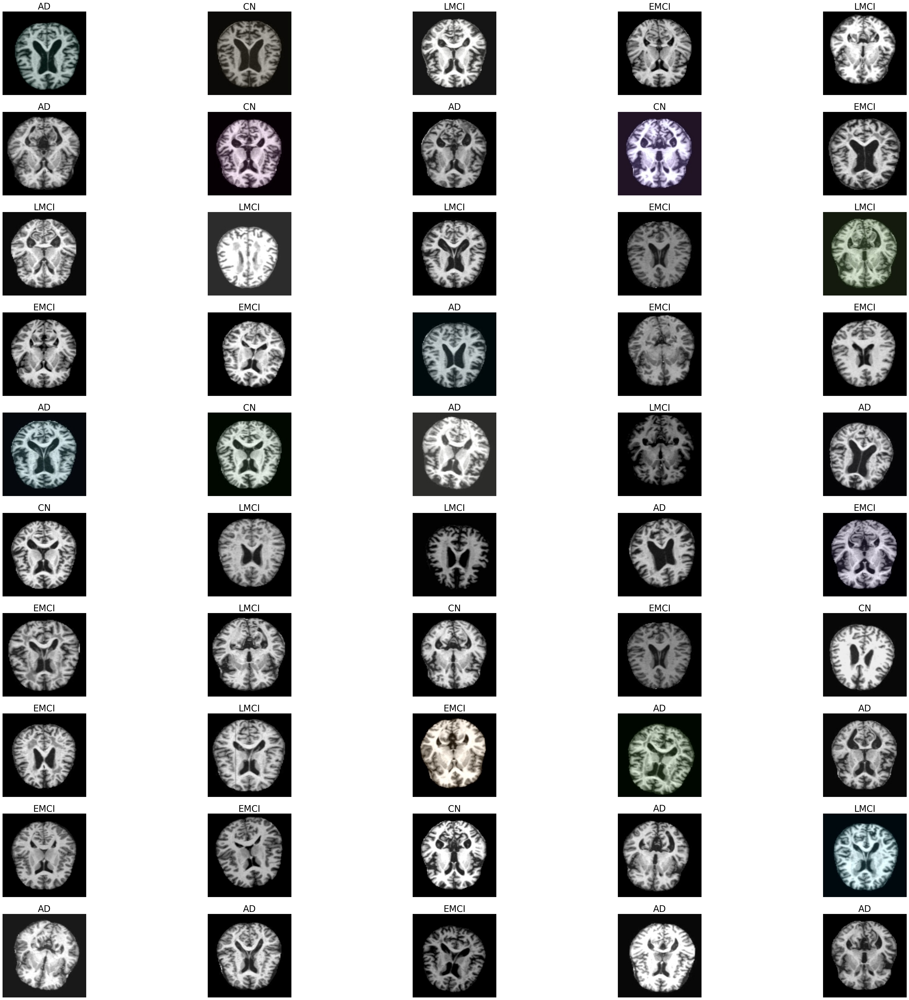

In [ ]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(df),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(df.image[i])
    img=cv2.resize(img,(224,224))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.axis('off')
    plt.title(df.label[i],fontsize=25)

In [ ]:
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.2, random_state=42,shuffle=True,stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_test1,y_test1, test_size=0.5, random_state=42,shuffle=True,stratify=y_test1)
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [ ]:
image_size = (224,224)
batch_size = 32
datagen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet.preprocess_input,
    rescale=1./255,
    horizontal_flip=True
)
train_generator = datagen.flow_from_dataframe(
    df_train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    df_test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)
val_generator = datagen.flow_from_dataframe(
    df_val,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

Found 27187 validated image filenames belonging to 4 classes.
Found 3399 validated image filenames belonging to 4 classes.
Found 3398 validated image filenames belonging to 4 classes.


In [ ]:
class_num=list(train_generator.class_indices.keys())
class_num

['AD', 'CN', 'EMCI', 'LMCI']

In [ ]:
import tensorflow as tf
from tensorflow import keras

model = keras.models.Sequential()
model.add(tf.keras.applications.VGG16(input_shape=(224, 224, 3), include_top=False, pooling='avg', weights='imagenet'))
model.add(keras.layers.Flatten())
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(2048, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(1024, activation='relu'))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.Dense(4, activation='softmax'))
model.layers[0].trainable = False

# Build the model with the correct input shape
model.build(input_shape=(None, 224, 224, 3))
model.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 512)            │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 2048)           │     1,050,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 1024)           │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 4)              │         4,100 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,881,924 (68.21 MB)

 Trainable params: 3,160,068 (12.05 MB)

 Non-trainable params: 14,721,856 (56.16 MB)

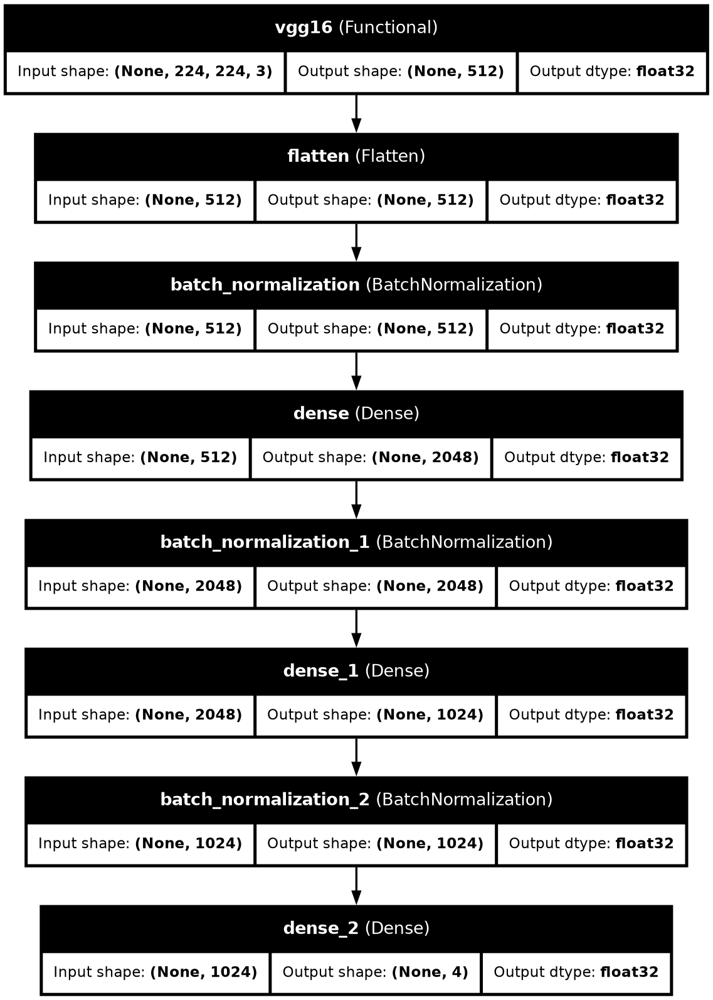

In [ ]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [ ]:
checkpoint_cb = ModelCheckpoint("model_VGG161.keras", save_best_only=True)
early_stopping_cb =EarlyStopping(patience=10, restore_best_weights=True)
model.compile(optimizer ='adam', loss='categorical_crossentropy', metrics=['accuracy'])
hist = model.fit(train_generator, epochs=50, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/50


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1732662776.397170     106 service.cc:145] XLA service 0x7bb670007210 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732662776.397236     106 service.cc:153]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1732662776.397241     106 service.cc:153]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/850 ━━━━━━━━━━━━━━━━━━━━ 4:56:13 21s/step - accuracy: 0.2500 - loss: 1.7761

I0000 00:00:1732662790.786920     106 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


850/850 ━━━━━━━━━━━━━━━━━━━━ 210s 223ms/step - accuracy: 0.6680 - loss: 1.0378 - val_accuracy: 0.8128 - val_loss: 0.5029
Epoch 2/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 137s 160ms/step - accuracy: 0.8461 - loss: 0.3888 - val_accuracy: 0.9067 - val_loss: 0.2449
Epoch 3/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 138s 161ms/step - accuracy: 0.8955 - loss: 0.2722 - val_accuracy: 0.9067 - val_loss: 0.2467
Epoch 4/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 138s 161ms/step - accuracy: 0.9162 - loss: 0.2178 - val_accuracy: 0.9270 - val_loss: 0.1955
Epoch 5/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 138s 161ms/step - accuracy: 0.9302 - loss: 0.1845 - val_accuracy: 0.9361 - val_loss: 0.1836
Epoch 6/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 138s 161ms/step - accuracy: 0.9401 - loss: 0.1597 - val_accuracy: 0.9488 - val_loss: 0.1476
Epoch 7/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 137s 161ms/step - accuracy: 0.9466 - loss: 0.1418 - val_accuracy: 0.9511 - val_loss: 0.1342
Epoch 8/50
850/850 ━━━━━━━━━━━━━━━━━━━━ 137s 161ms/step - accuracy: 0.9575 - loss: 0.11

In [ ]:
model.save('/kaggle/working/model_VGG161.keras')
model.export('/kaggle/working/model_VGG161')

Saved artifact at '/kaggle/working/model_VGG161'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='input_layer_1')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  136025582807600: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582811824: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582898864: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582903088: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582906256: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582905552: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582908016: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582909072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582912432: TensorSpec(shape=(), dtype=tf.resource, name=None)
  136025582913136: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1

In [ ]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.741089,0.699042,0.812831,0.502866
1,0.853423,0.374858,0.906710,0.244925
2,0.893773,0.274161,0.906710,0.246658
3,0.914959,0.223139,0.927016,0.195503
4,0.930077,0.186366,0.936139,0.183615
5,0.938610,0.161310,0.948793,0.147554
6,0.947659,0.141753,0.951148,0.134212
7,0.955604,0.121334,0.949971,0.146290
8,0.956413,0.120034,0.964391,0.115936
9,0.962960,0.099642,0.967039,0.100082


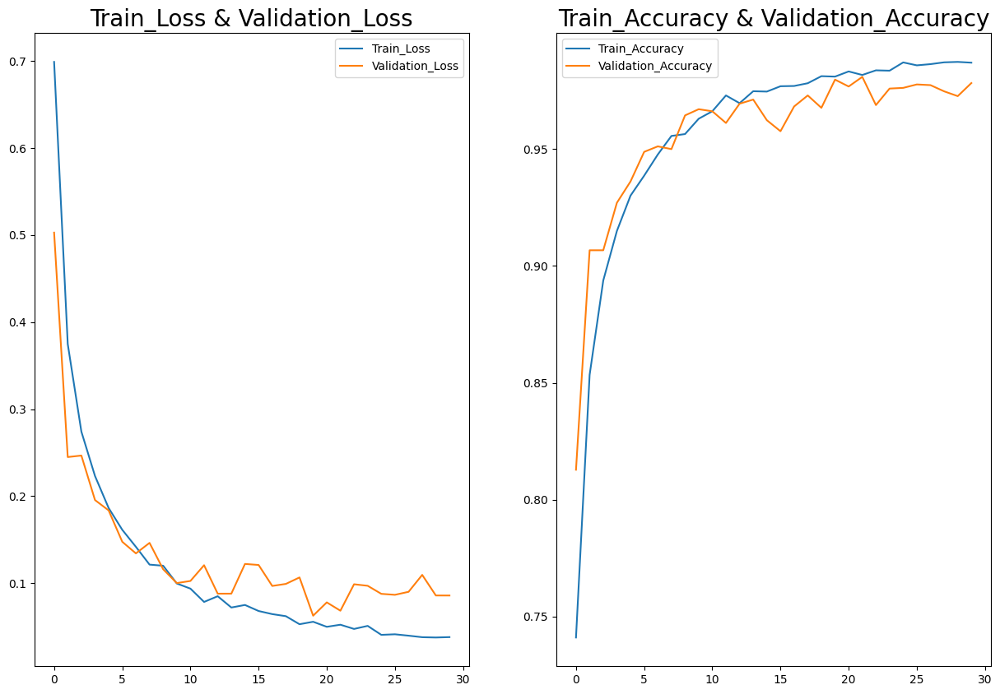

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.show()

In [ ]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions,axis=1)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


107/107 ━━━━━━━━━━━━━━━━━━━━ 38s 352ms/step


,Actual,Prediction
0,2,2
1,0,0
2,1,1
3,0,0
4,1,1
...,...,...
3394,2,2
3395,1,1
3396,2,3
3397,2,2


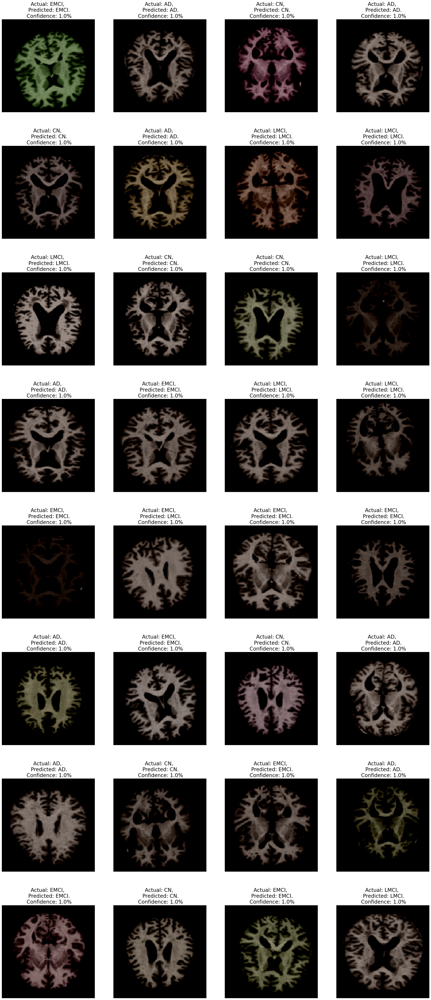

In [ ]:
plt.figure(figsize=(30,70))
batch = next(test_generator)
images= batch[0]
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(f"Actual: {class_num[y_test[n]]}, \n Predicted: {class_num[y_pred[n]]}.\n Confidence: {round(predictions[n][np.argmax(predictions[n])],0)}%",fontsize=20)

array([[880,   0,   5,  11],
       [  0, 647,   0,   0],
       [  2,   0, 933,  25],
       [  8,   0,  19, 869]])

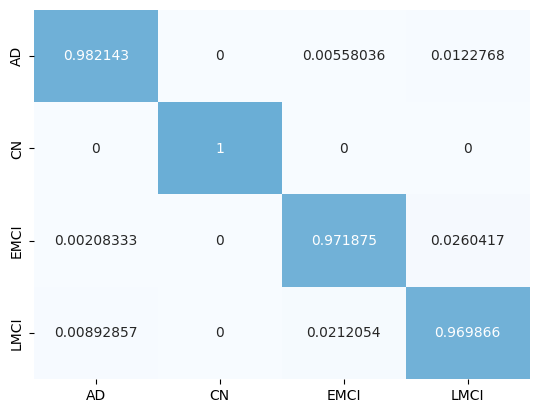

In [ ]:
CM = confusion_matrix(y_test,y_pred)
CM_percent = CM.astype('float') / CM.sum(axis=1)[:, np.newaxis]
sns.heatmap(CM_percent,fmt='g',center = True,cbar=False,annot=True,cmap='Blues',xticklabels=class_num, yticklabels=class_num)
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred,target_names=class_num)
print('Classification Report is : ', ClassificationReport)

Classification Report is :                precision    recall  f1-score   support

          AD       0.99      0.98      0.99       896
          CN       1.00      1.00      1.00       647
        EMCI       0.97      0.97      0.97       960
        LMCI       0.96      0.97      0.97       896

    accuracy                           0.98      3399
   macro avg       0.98      0.98      0.98      3399
weighted avg       0.98      0.98      0.98      3399



In [ ]:
class_num=list(train_generator.class_indices.keys())
class_num

['AD', 'CN', 'EMCI', 'LMCI']

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/kaggle/working/model_VGG161.keras')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


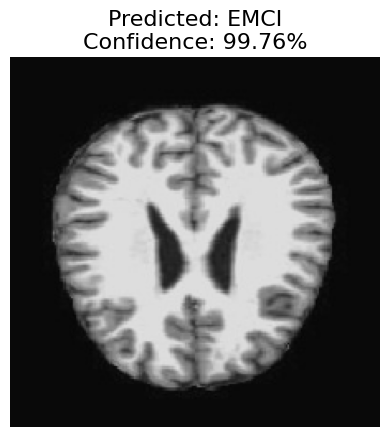

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

def predict_single_image(model, image_path, class_num, target_size=(224, 224)):
    """
    Predicts the class of a single image and displays it with the prediction and confidence.

    Args:
        model: Trained Keras model.
        image_path (str): Path to the image file.
        class_num (dict): Dictionary mapping class indices to class labels.
        target_size (tuple): Target size for resizing the image.
    """
    # Load and preprocess the image
    image = load_img(image_path, target_size=target_size)
    image_array = img_to_array(image)  # Convert to numpy array
    image_array = np.expand_dims(image_array, axis=0)  # Add batch dimension
    image_array = image_array / 255.0  # Normalize

    # Predict
    predictions = model.predict(image_array)
    predicted_class_index = np.argmax(predictions)
    predicted_class_label = class_num[predicted_class_index]
    confidence = round(np.max(predictions) * 100, 2)

    # Display the image and prediction
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {predicted_class_label}\nConfidence: {confidence}%", fontsize=16)
    plt.show()

# Example Usage
image_path = "/content/AugmentedAlzheimerDataset/EMCI/0018f6e9-4716-4f8d-aad6-b9bc1b40b255.jpg"
class_num = {0: 'AD', 1: 'CN', 2: 'EMCI', 3: 'LMCI'}
predict_single_image(model, image_path, class_num)
